# Text Localization using Segmentation



Step 1:    **Segmentation mask** is generated by using ground truth bounding box coordinates. So, that segmentation algorithm can  be trained **end-to-end**.


Step 2:    Image augmentation techniques like random crop, random scaling, random rotation, random shear etc are applied. **Identical image augmentation is applied to both input image and the mask image**.


Step 3:     **Fully Convolutional Network** is used for segmentation. **Pre-trained VGG_11 with batch normalization is used as an encoder network**. It's weights are not updated.


Step 4:    Output from the network is mask image. To get bounding boxes mask image is processed as follows:


- Mask is converted into **Binary Image** by the threshold of 0.5 and **Opening operation** is applied with filter of size 5*5.

- **Breadth First Search** is applied to find out all **Connected Components**. A connected component represents a text region. 

- Bounding Box of connected components are calculated.

### Input Image

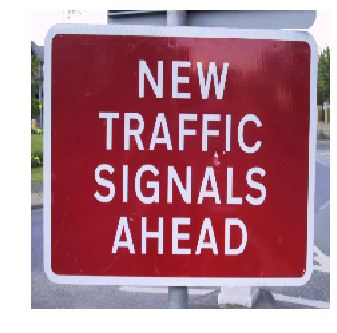

In [2]:
from IPython.display import Image
Image(filename=r"doc_images/input_image.png") 

### Generated Mask

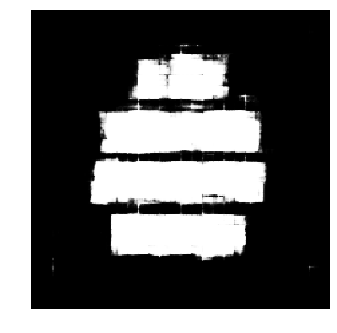

In [3]:
Image(filename=r"doc_images/generated_mask.png") 

### After Binarization

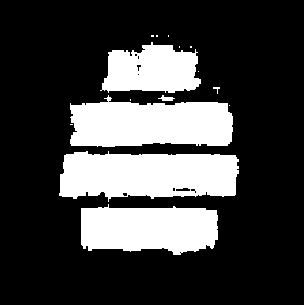

In [4]:
Image(filename=r"doc_images/binary_image.png") 

### After Opening(Erosion and Dilution)

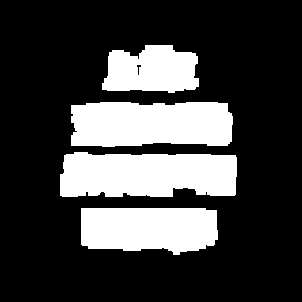

In [5]:
Image(filename=r"doc_images/opening.png")

### Connected Coponents

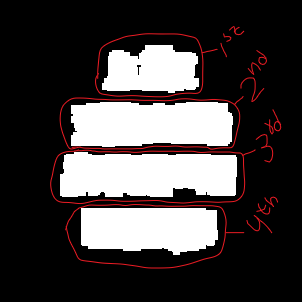

In [6]:
Image(filename=r"doc_images/connected_components.png")

### Input Image with Bounding Boxes

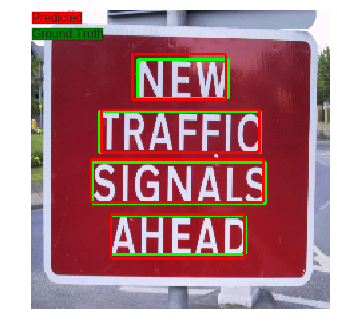

In [7]:
Image(filename=r"doc_images/bounding_box.png") 

In [0]:
#Importing all required moduls
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torchvision import transforms
import torchvision.transforms.functional as TF
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import cv2
import os
import random
import re
import copy 

In [9]:
#If GPU available set device to GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Device: ',device)

Device:  cuda:0


In [0]:
class TD_Dataset(Dataset):
  
    hight = 224
    width = 224
  
    #Constructor
    def __init__(self,image_path=r'images',gt_path=r'ground_truth',augmentation=False):
        self.image_path = image_path
        self.gt_path = gt_path
        self.images_names = os.listdir(self.image_path)
        self.length = len(self.images_names)
        self.augmentation = augmentation
        self.normalize = transforms.Compose([transforms.ToTensor(),transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
  
    # len() function implementaion
    def __len__(self):
        return self.length
  
  
    #Method which applies image augmentation to both input image and mask image
    @staticmethod
    def segmentation_transforms(image, mask):
      
        #Randomly change the brightness, contrast, saturation and hue of an image. Only for input image
        image=torchvision.transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1)(image)
        
        
        #Randomly convert image to grayscale. Only for input image
        image = transforms.RandomGrayscale(0.05)(image)
        
        
        #Random Croping and Resizing to original size
        i, j, h, w = transforms.RandomCrop.get_params(image, output_size=(200, 200))
        image = TF.crop(image, i, j, h, w)
        mask = TF.crop(mask, i, j, h, w)
        image = TF.resize(image, (TD_Dataset.hight,TD_Dataset.width))
        mask = TF.resize(mask, (TD_Dataset.hight,TD_Dataset.width))
       
        
        #Horizontal and  Vertical Flip with probability of 0.5
        if random.random() > 0.5:
            image = TF.hflip(image)
            mask = TF.hflip(mask)
      
        if random.random() > 0.5:
            image = TF.vflip(image)
            mask = TF.vflip(mask)
            
            
            
        #Random affine transformation keeping center invariant
        if random.random() > 0.5:
            angle = random.randint(-20, 20)
            t_h,t_v = random.randint(-20,20),random.randint(-20,20)
            shear = random.randint(-20,20)
            scale = random.randint(8,12)/10
            image = TF.affine(image, angle, (t_h,t_v), scale, shear)
            mask = TF.affine(mask, angle, (t_h,t_v), scale, shear)
         
        return image, mask
      
      
    #Implementing indexing ([])
    def __getitem__(self, index):
        #Get image name
        input_image_name = self.images_names[index]
        #Get image
        input_image = Image.open(os.path.join(self.image_path,input_image_name))
        #Get image size
        input_image_size = input_image.size
        #Resize image
        input_image = input_image.resize((TD_Dataset.hight,TD_Dataset.width))
        #Get ground turth file path
        output_file_path = os.path.join(self.gt_path,'gt_'+input_image_name[:-4]+'.txt')
        #Get output mask and original boxes
        output_image,original_boxes,resized_boxes = TD_Dataset.give_output_image(output_file_path,input_image_size)
        
        if self.augmentation==True:
            #Get augmented image and mask
            input_image,output_image = TD_Dataset.segmentation_transforms(input_image,output_image)
            
        #Convert input image to tensor and normalize image    
        input_image = self.normalize(input_image)

        #Convert mask to tensor
        output_image = torch.from_numpy(np.array(output_image,dtype='uint8'))
        
        return (input_image,output_image,input_image_size,original_boxes,resized_boxes)
      
      
    #Takes ground truth file name,image size. Returns image mask  
    @staticmethod   
    def give_output_image(path,input_size):
        #Read the file
        text = open(path).read()
        #Collect each box in list
        boxes = [x.strip().split(' ')[:-1] for x in text.strip().split('\n')]
        #Convert the string value into integer(co-ordinates)
        for i in range(len(boxes)):
            boxes[i] = [TD_Dataset.give_number(j) for j in boxes[i]]
        
        original_boxes = copy.deepcopy(boxes)
        #Resize original_boxes of original image to boxes in the image of shape TD_Dataset.width , TD_Dataset.hight
        for i in range(len(boxes)):
            boxes[i] = TD_Dataset.resize_boxes(boxes[i],input_size,(TD_Dataset.width,TD_Dataset.hight))
        #Create Mask image 
        image = np.zeros((TD_Dataset.hight,TD_Dataset.width),dtype='uint8')
        for box in boxes:
            image[box[1]:box[3],box[0]:box[2]] = 1
        return Image.fromarray(image,'L'),original_boxes,boxes
    
    
    #Convert the bounding boxes co-ordinates for different image sizes
    @staticmethod
    def resize_boxes(box,initial_size,final_size):
        box[0] = int(final_size[0]*(box[0]/initial_size[0]))
        box[1] = int(final_size[1]*(box[1]/initial_size[1]))
        box[2] = int(final_size[0]*(box[2]/initial_size[0]))
        box[3] = int(final_size[1]*(box[3]/initial_size[1]))
        return box
    
    #Takes string and returns number from it 
    @staticmethod
    def give_number(string):
        string = string.strip()
        string = re.sub("\D","",string)
        return int(string)

In [0]:
#Train data with no augmentation
train_data = TD_Dataset(augmentation=False)
#Train data and loader with augmentation
aug_train_data = TD_Dataset(augmentation=True)
aug_train_dataloader = DataLoader(train_data, batch_size=24, shuffle=True, num_workers=8)

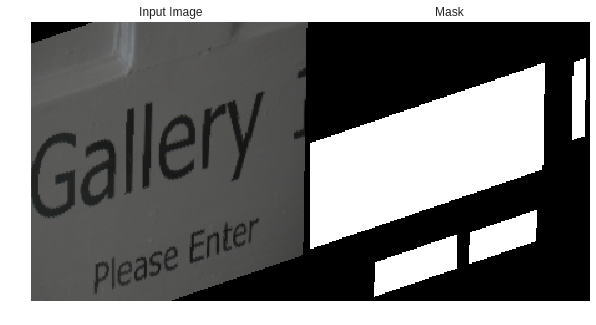

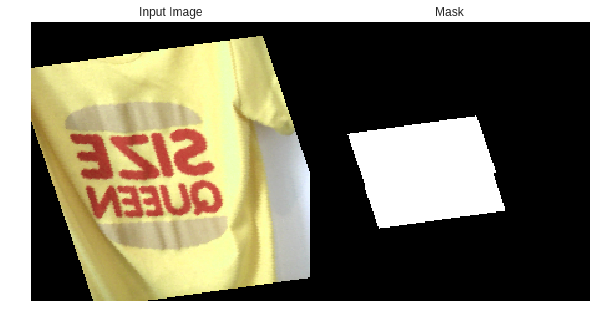

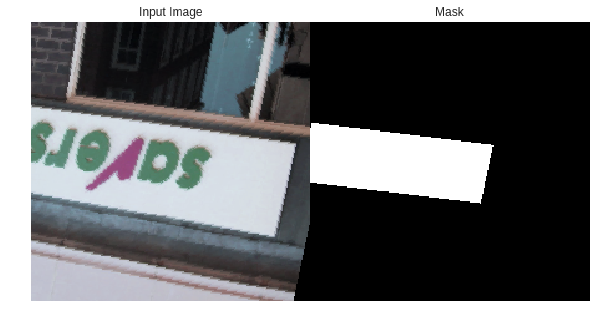

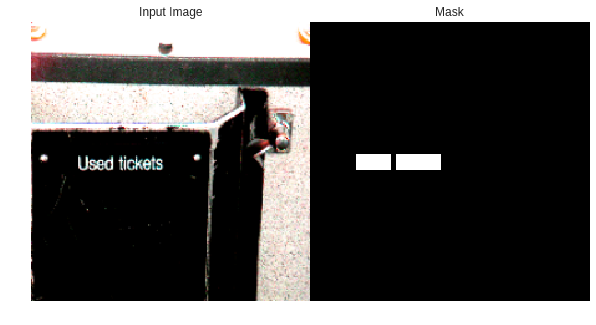

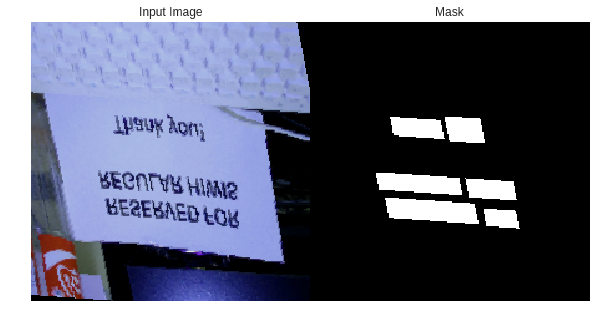

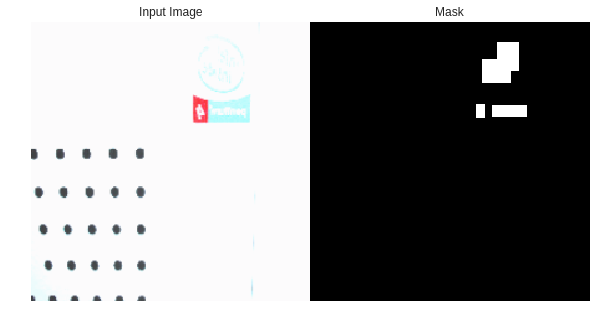

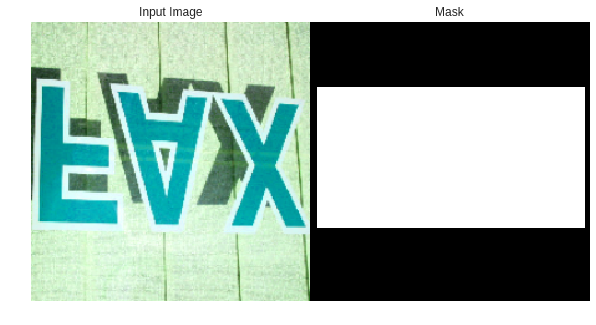

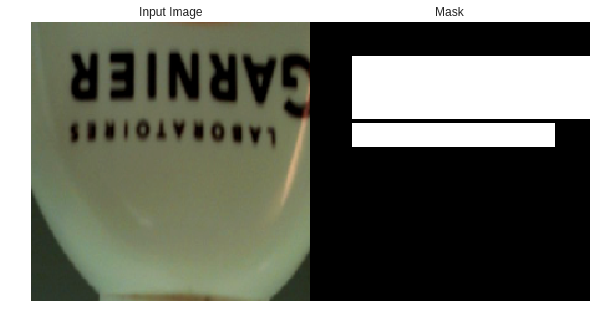

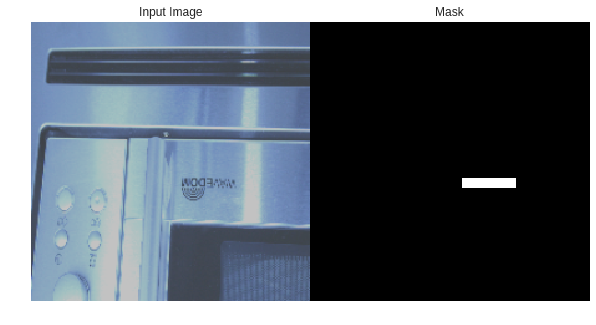

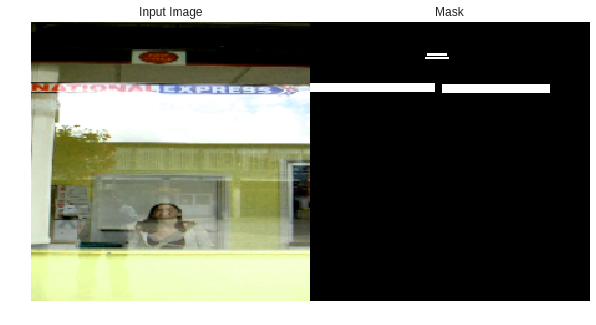

In [12]:
#Code for inspecting augmented images and masks

#Does inverse of input image normalization so that it can be plotted using matplotlib
def inverse_preprocess(image):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    image[:,0,:,:] *= std[0]
    image[:,0,:,:] += mean[0]
    image[:,1,:,:] *= std[1]
    image[:,1,:,:] += mean[1]
    image[:,2,:,:] *= std[2]
    image[:,2,:,:] += mean[2]
    return image

#Plots some augmented images and their corrosponding masks  
N = 10
#Loop over some random sample
for i in random.sample(range(0,len(train_data)),N):
    data = aug_train_data[i]
    inveresed_image = inverse_preprocess(data[0].view(1,3,TD_Dataset.hight,TD_Dataset.width))
    figure,axis = plt.subplots(1, 2) 
    figure.set_figheight(10)
    figure.set_figwidth(10)
    axis[0].imshow(inveresed_image.view(3,TD_Dataset.hight,TD_Dataset.width).permute(1,2,0))
    axis[0].title.set_text('Input Image')
    axis[1].imshow(data[1].view(TD_Dataset.hight,TD_Dataset.width),cmap='gray')
    axis[1].title.set_text('Mask')
    axis[0].axis('off')
    axis[1].axis('off')
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

In [0]:
#VGG feature extractor of FCN.
class FCN_VGG(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.model=torchvision.models.vgg11_bn(pretrained=True)
        #We don't need fully connected part of VGG, so removing it
        del self.model.classifier
        for parameter in self.model.parameters():
            parameter.requires_grad=False
    
    def forward(self,x):
        outputs=[]
        #If image is forwarded then FCN_VGG return outputs of every maxpooling layer
        #First Maxpooling layer number in VGG   :3
        #Second Maxpooling layer number in VGG  :7
        #Third Maxpooling layer number in VGG   :14
        #Fourth Maxpooling layer number in VGG  :21
        #Fifth Maxpooling layer number in VGG   :28
        for layer_number in [3,7,14,21,28]:
            t=x
            for j in range(layer_number+1):
                t=self.model.features[j](t)
            outputs.append(t)
        return outputs

In [0]:
#FCN
class FCN(nn.Module):

    def __init__(self):
        super().__init__()
        #Feature extractor VGG
        self.vgg = FCN_VGG()
        #Upsampling layers
        self.transconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.batch_norm1 = nn.BatchNorm2d(512)
        self.transconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.batch_norm2 = nn.BatchNorm2d(256)
        self.transconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.batch_norm3 = nn.BatchNorm2d(128)
        self.transconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.batch_norm4 = nn.BatchNorm2d(64)
        self.transconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.batch_norm5 = nn.BatchNorm2d(32)
        self.conv1 = nn.Conv2d(32, 1, kernel_size=1)

    def forward(self, x):
        output = self.vgg(x)
        # output[0] shape: (batch_size, 64, 112, 112)
        # output[1] shape: (batch_size, 128, 56, 56)
        # output[2] shape: (batch_size, 256, 28, 28)
        # output[3] shape: (batch_size, 512, 14, 14)
        # output[4] shape: (batch_size, 512, 7, 7)
        
        x = self.batch_norm1(F.relu(self.transconv1(output[4])))     # output_shape: (batch_size, 512, 14, 14)
        x = x + output[3]                                            # Skip-Connection
        x=nn.Dropout2d(0.2)(x)                                       # 2D channel Dropout
        x = self.batch_norm2(F.relu(self.transconv2(x)))             # output_shape: (batch_size, 256, 28, 28)
        x = x + output[2]                                            # Skip-Connection
        x=nn.Dropout2d(0.2)(x)                                       # 2D channel Dropout
        x = self.batch_norm3(F.relu(self.transconv3(x)))             # output_shape: (batch_size, 128, 56, 56)
        x = x + output[1]                                            # Skip-Connection
        x=nn.Dropout2d(0.2)(x)                                       # 2D channel Dropout
        x = self.batch_norm4(F.relu(self.transconv4(x)))             # output_shape: (batch_size, 64, 112, 112)
        x = x + output[0]                                            # Skip-Connection
        x=nn.Dropout2d(0.2)(x)                                       # 2D channel Dropout
        x = self.batch_norm5(F.relu(self.transconv5(x)))             # output_shape: (batch_size, 32, 224, 224)
        x = self.conv1(x)                                            # output_shape: (batch_size, 1, 224, 224)
        x = torch.sigmoid(x)
        return x  

In [15]:
net=FCN()
#Convert net to cuda if available
net.to(device)

Downloading: "https://download.pytorch.org/models/vgg11_bn-6002323d.pth" to /root/.torch/models/vgg11_bn-6002323d.pth
531503671it [00:09, 58192586.24it/s]


FCN(
  (vgg): FCN_VGG(
    (model): VGG(
      (features): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace)
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (6): ReLU(inplace)
        (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (10): ReLU(inplace)
        (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, 

In [0]:
#Function which checks if index is inside the image
def is_inside(index,size):
    if index[0]>=0 and index[0]<size[0]:
        if index[1]>=0 and index[1]<size[1]:
            return True
    return False

In [0]:
#Function for Breath First Search to find all connected-component(text region) and returns their bounding box co-ordinates 
def give_box(image,visited,index):
    #Initilize queue with initial node
    queue=[index]
    visited[index]=True
    #Initial maximum and minimum x and y co-ordinates by initial node
    max_x,max_y=index
    min_x,min_y=index
    while(len(queue)>0):
        ind=queue.pop(0)
        #Update maximum and minimum x and y co-ordinates
        if ind[0]<min_x:
            min_x=ind[0]
        if ind[0]>max_x:
            max_x=ind[0]
        if ind[1]<min_y:
            min_y=ind[1]
        if ind[1]>max_y:
            max_y=ind[1]
        #Explores and 4 directions from the node 
        for change in [(0,-1),(-1,0),(0,1),(1,0)]:
            new_index=(ind[0]+change[0],ind[1]+change[1])
            #Append if new node of connected-component is found
            if is_inside(new_index,image.shape) and image[new_index]==1 and visited[new_index]==False:
                queue.append(new_index)
                visited[new_index]=True
    return [min_y,min_x,max_y,max_x]

In [0]:
def give_boxes(image):
    #This function does following things:
    
    #->Binarization of the generated mask image.
    
    #->Applies Opening(erosion followed by dilation) on the generated mask image to remove noise and to seperate close connected components(text region).
    
    #->Visulazie the image as an undirected graph where edge exist only between adjacent pixels with value one. Thus, text region(regions of ones) is represented by 
    #  connected component in that graph then apply Breath First Search(BFS) to find out all the connected-components in the graph and returns their bounding 
    #  box co-ordinates.
    
    image=image.numpy()
    image=(image>0.5).astype('uint8')
    kernel = np.ones((5,5),np.uint8)
    image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    boxes=[]
    #Initilize all node as unvisited(False)
    visited=np.zeros(image.shape,dtype='bool')
    #Loop over all nodes if unvisited do Breath First Search and collect bounding box co-ordinates
    for index,x in np.ndenumerate(image):
        if x==1 and visited[index]==False:
            box=give_box(image,visited,index)
            boxes.append(box)
    return boxes

In [0]:
#Function which draws boundig boxes around texts
def draw_boxes(boxes,image,width,color):
    boxed_image=image.clone()
    for box in boxes:
        draw_box(box,boxed_image,width,color)
    return boxed_image

In [0]:
#Function which draws bounding box around text
def draw_box(box,image,width,color):
    # RBG Image has 
    # 0 channel: Red
    # 1 channel: Green
    # 2 channel: Blue
    
    Color={'red':0,'green':1,'blue':2}
    
    #Remove color 
    image[:,box[1]-width:box[1]+width,box[0]:box[2]]=0
    image[:,box[1]:box[3],box[0]-width:box[0]+width]=0
    image[:,box[3]-width:box[3]+width,box[0]:box[2]]=0
    image[:,box[1]:box[3],box[2]-width:box[2]+width]=0
    
    #Fill in color 
    image[Color[color],box[1]-width:box[1]+width,box[0]:box[2]]=1
    image[Color[color],box[1]:box[3],box[0]-width:box[0]+width]=1
    image[Color[color],box[3]-width:box[3]+width,box[0]:box[2]]=1
    image[Color[color],box[1]:box[3],box[2]-width:box[2]+width]=1

In [0]:
def inspect(N=3):
    #Convert net to evaluation mode
    net.eval()
    #Make subplot
    figure,axis = plt.subplots(N, 3) 
    figure.set_figheight(N*5+2)
    figure.set_figwidth(15)
    
    with torch.no_grad():
        for i in range(N):
            #Randomly sample index
            index=random.randint(0, len(train_data)-1)
            data=train_data[index]
            image=data[0].view(1,3,TD_Dataset.hight,TD_Dataset.width)
            #Generate mask of image
            output=net(image.to(device)).detach().to('cpu').view(TD_Dataset.hight,TD_Dataset.width)
            #Inverse preprocess image for plotting
            org_image=inverse_preprocess(image).view(3,TD_Dataset.hight,TD_Dataset.width)
            #Plot images,mask and bounding boxes
            axis[i,0].imshow(org_image.permute(1,2,0))
            axis[i,0].title.set_text('Input Image')
            
            axis[i,1].imshow(output,cmap='gray')
            axis[i,1].title.set_text('Generated Mask')
            
            #Plot ground truth bounding box
            boxed_image=draw_boxes(data[-1],org_image,1,'green')
            #Plot predicted bounding box
            boxed_image=draw_boxes(give_boxes(output),boxed_image,1,'red')
            axis[i,2].imshow(boxed_image.permute(1,2,0))
            axis[i,2].title.set_text('Input Image with bounding boxes')
            axis[i,2].text(0, 8, 'Predicted', bbox={'facecolor': 'Red', 'pad': 0})
            axis[i,2].text(0, 20, 'Ground Truth', bbox={'facecolor': 'Green', 'pad': 0})
            
            axis[i,0].axis('off')
            axis[i,1].axis('off')
            axis[i,2].axis('off')
        plt.subplots_adjust(wspace=0, hspace=0)
        plt.show()

In [0]:
#Optimizer for traning network
optimizer = optim.Adam(net.parameters(), lr=0.001)

In [0]:
#Function to train network
def train_net(epochs=20):
    for e in range(1,epochs+1):
        print('-------------------------Epoch Number: {}---------------------'.format(e))
        avg_loss=0
        #As inspect convert model to eval mode every epoch.Convert model to back to traning mode
        net.train()
        for i,data in enumerate(aug_train_dataloader,1):
            #Clear gradients
            optimizer.zero_grad()
            
            X=data[0].to(device)
            y=data[1].to(device)
            
            y=y.to(dtype=torch.float)
            
            output=net(X)
            output=output.view(output.shape[0],output.shape[2],output.shape[3])
            
            loss_fn=nn.BCELoss()
            loss=loss_fn(output,y)
            loss.backward()
            avg_loss+=loss.item()
            #Update the weights
            optimizer.step()
            
        print('Average Loss :',avg_loss/i)
            
        if e%10==0:
            inspect()      

-------------------------Epoch Number: 1---------------------
Average Loss : 0.5484057441353798
-------------------------Epoch Number: 2---------------------
Average Loss : 0.43440059423446653
-------------------------Epoch Number: 3---------------------
Average Loss : 0.36451205164194106
-------------------------Epoch Number: 4---------------------
Average Loss : 0.29842486307024957
-------------------------Epoch Number: 5---------------------
Average Loss : 0.23980074226856232
-------------------------Epoch Number: 6---------------------
Average Loss : 0.19541999250650405
-------------------------Epoch Number: 7---------------------
Average Loss : 0.15630573481321336
-------------------------Epoch Number: 8---------------------
Average Loss : 0.13015432097017765
-------------------------Epoch Number: 9---------------------
Average Loss : 0.10930481702089309
-------------------------Epoch Number: 10---------------------
Average Loss : 0.09558482505381108


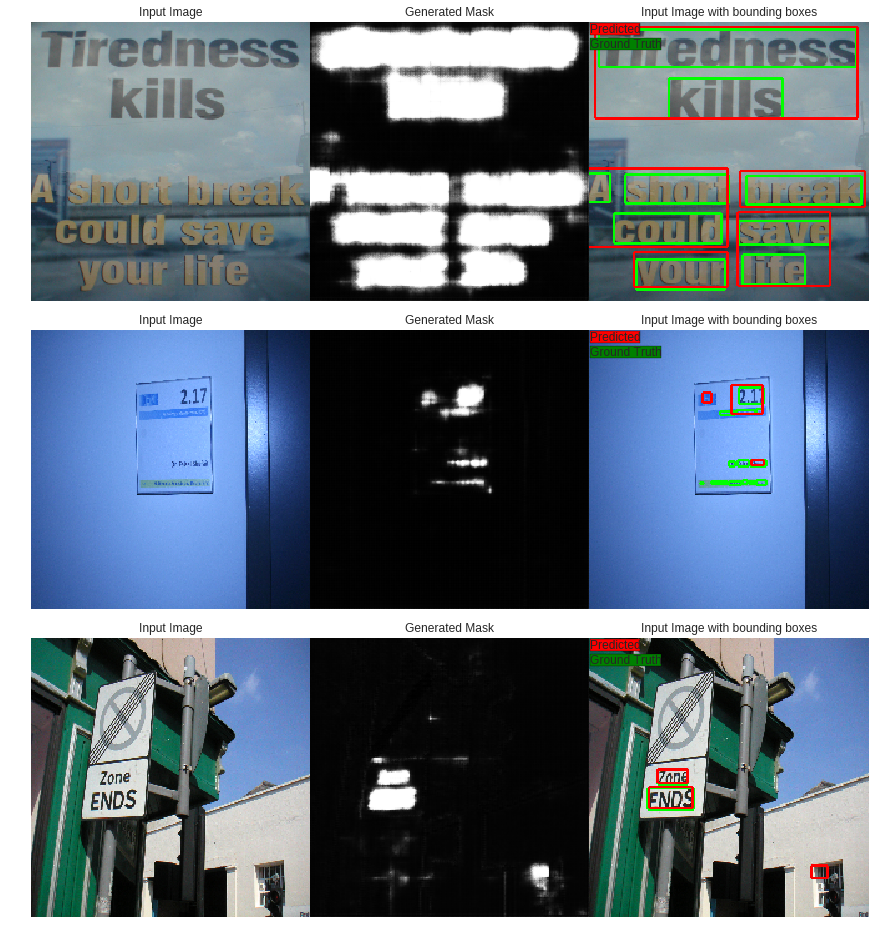

-------------------------Epoch Number: 11---------------------
Average Loss : 0.08759909272193908
-------------------------Epoch Number: 12---------------------
Average Loss : 0.07772656753659249
-------------------------Epoch Number: 13---------------------
Average Loss : 0.07144181504845619
-------------------------Epoch Number: 14---------------------
Average Loss : 0.06666160523891448
-------------------------Epoch Number: 15---------------------
Average Loss : 0.06170553136616945
-------------------------Epoch Number: 16---------------------
Average Loss : 0.05428245160728693
-------------------------Epoch Number: 17---------------------
Average Loss : 0.05141118410974741
-------------------------Epoch Number: 18---------------------
Average Loss : 0.04955889862030745
-------------------------Epoch Number: 19---------------------
Average Loss : 0.053835227899253366
-------------------------Epoch Number: 20---------------------
Average Loss : 0.05499818753451109


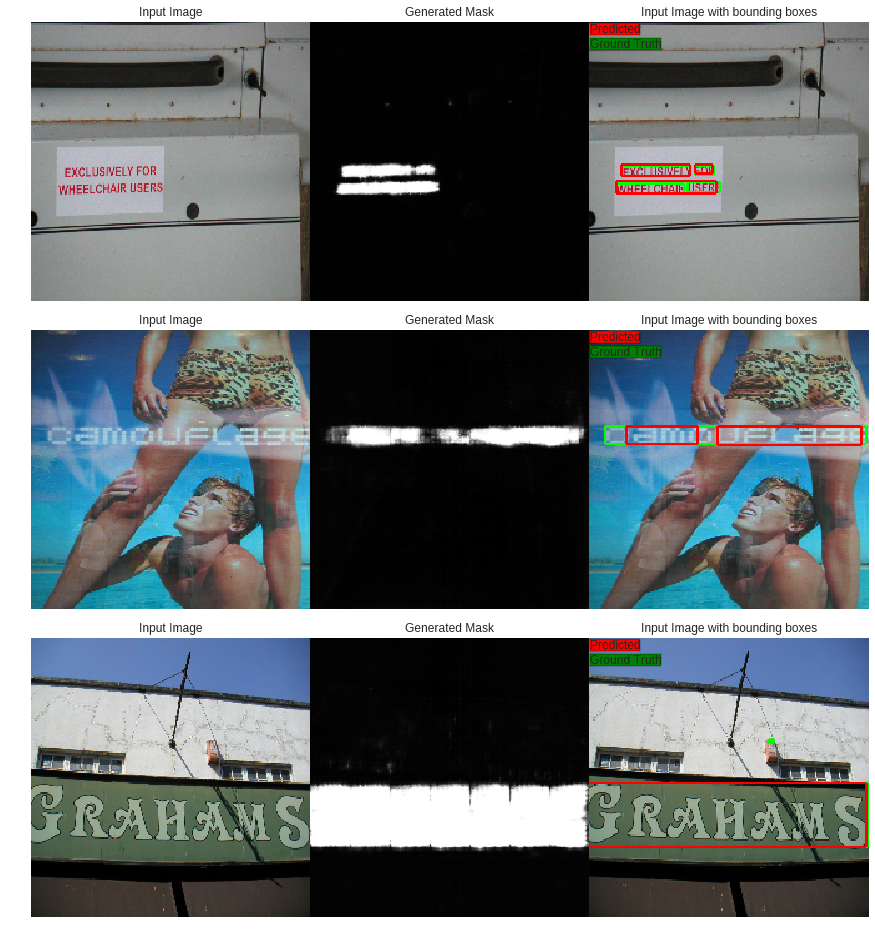

-------------------------Epoch Number: 21---------------------
Average Loss : 0.043604126572608946
-------------------------Epoch Number: 22---------------------
Average Loss : 0.04251011228188872
-------------------------Epoch Number: 23---------------------
Average Loss : 0.03525187782943249
-------------------------Epoch Number: 24---------------------
Average Loss : 0.036153678689152
-------------------------Epoch Number: 25---------------------
Average Loss : 0.03576431181281805
-------------------------Epoch Number: 26---------------------
Average Loss : 0.03288110261783004
-------------------------Epoch Number: 27---------------------
Average Loss : 0.030588152911514045
-------------------------Epoch Number: 28---------------------
Average Loss : 0.028716166596859695
-------------------------Epoch Number: 29---------------------
Average Loss : 0.0292790194042027
-------------------------Epoch Number: 30---------------------
Average Loss : 0.029018676932901145


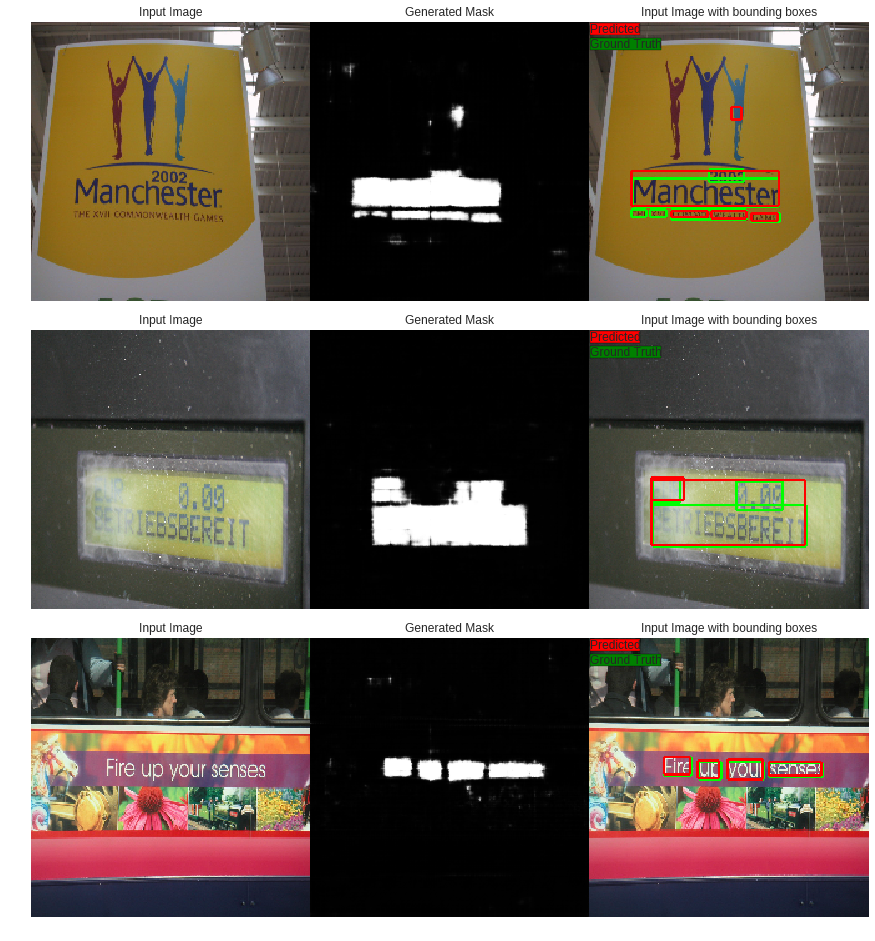

-------------------------Epoch Number: 31---------------------
Average Loss : 0.030116546526551248
-------------------------Epoch Number: 32---------------------
Average Loss : 0.027966820728033782
-------------------------Epoch Number: 33---------------------
Average Loss : 0.025136231165379285
-------------------------Epoch Number: 34---------------------
Average Loss : 0.021131360437721014
-------------------------Epoch Number: 35---------------------
Average Loss : 0.019584125373512506
-------------------------Epoch Number: 36---------------------
Average Loss : 0.020629189582541584
-------------------------Epoch Number: 37---------------------
Average Loss : 0.01900914995931089
-------------------------Epoch Number: 38---------------------
Average Loss : 0.0266059635207057
-------------------------Epoch Number: 39---------------------
Average Loss : 0.03279198817908764
-------------------------Epoch Number: 40---------------------
Average Loss : 0.027795840706676244


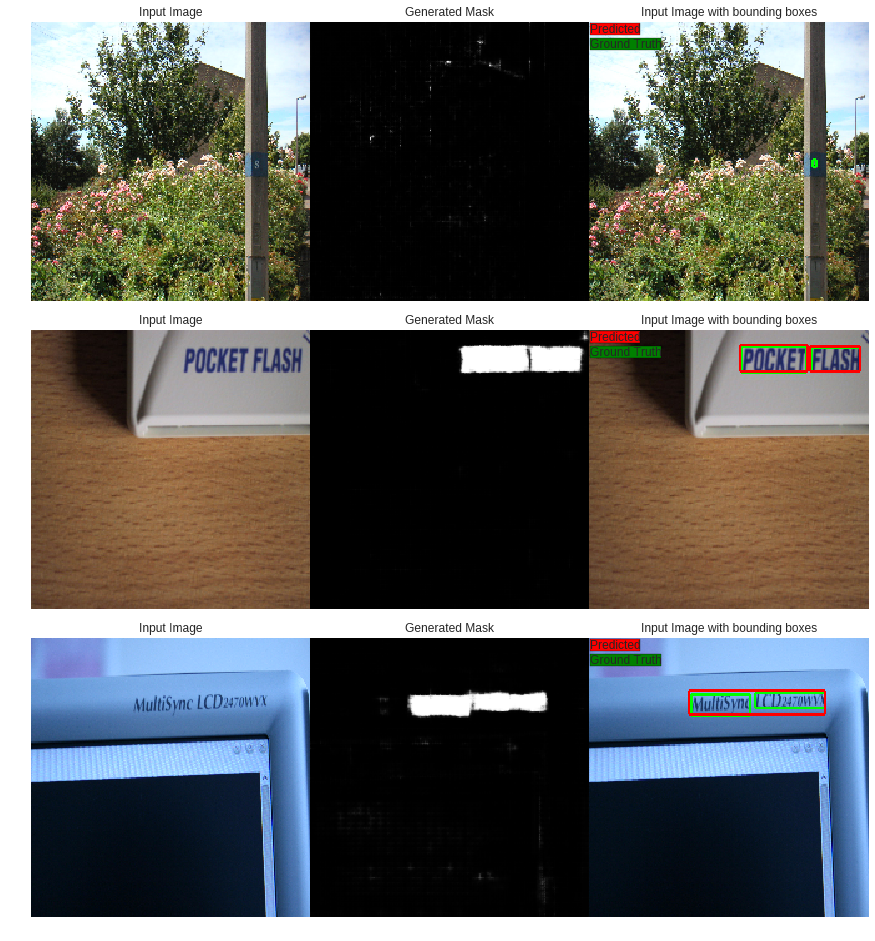

-------------------------Epoch Number: 41---------------------
Average Loss : 0.028056292049586772
-------------------------Epoch Number: 42---------------------
Average Loss : 0.025505492091178895
-------------------------Epoch Number: 43---------------------
Average Loss : 0.02306944504380226
-------------------------Epoch Number: 44---------------------
Average Loss : 0.02120249909348786
-------------------------Epoch Number: 45---------------------
Average Loss : 0.019463667785748838
-------------------------Epoch Number: 46---------------------
Average Loss : 0.020080462377518416
-------------------------Epoch Number: 47---------------------
Average Loss : 0.016149098845198752
-------------------------Epoch Number: 48---------------------
Average Loss : 0.017420172039419413
-------------------------Epoch Number: 49---------------------
Average Loss : 0.01649711634963751
-------------------------Epoch Number: 50---------------------
Average Loss : 0.016427528904750945


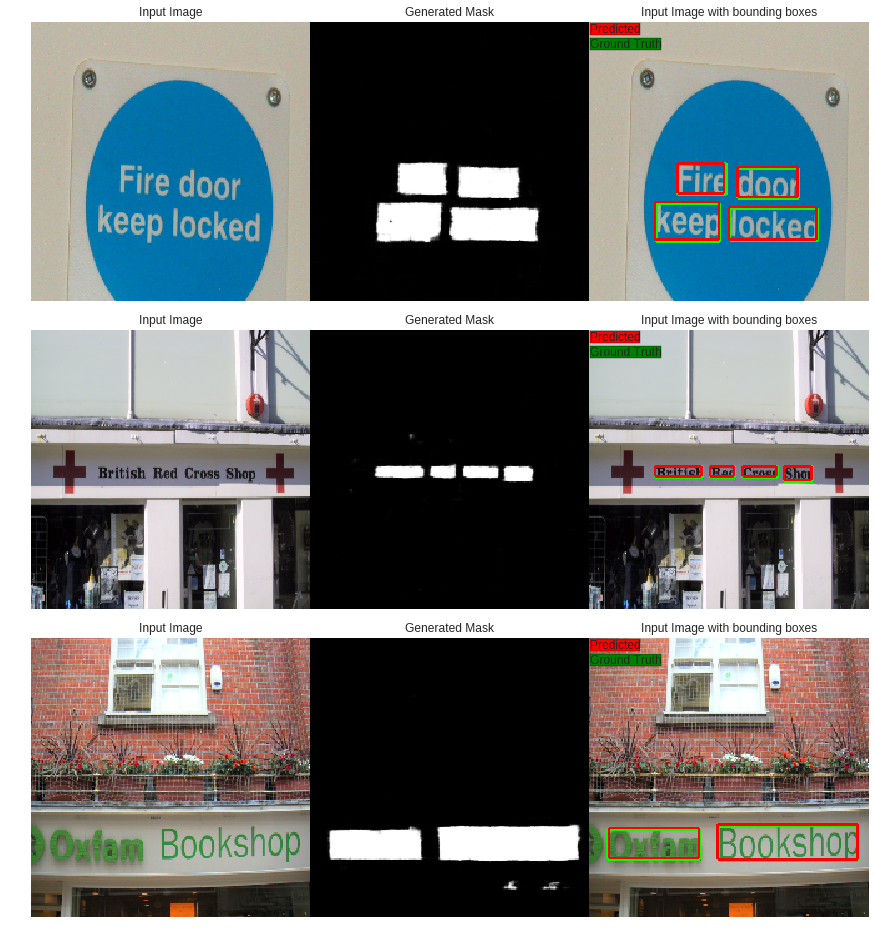

-------------------------Epoch Number: 51---------------------
Average Loss : 0.01548347445204854
-------------------------Epoch Number: 52---------------------
Average Loss : 0.015456800814718008
-------------------------Epoch Number: 53---------------------
Average Loss : 0.014315227465704083
-------------------------Epoch Number: 54---------------------
Average Loss : 0.015154579374939203
-------------------------Epoch Number: 55---------------------
Average Loss : 0.014842040371149778
-------------------------Epoch Number: 56---------------------
Average Loss : 0.014377409685403108
-------------------------Epoch Number: 57---------------------
Average Loss : 0.012632919708266854
-------------------------Epoch Number: 58---------------------
Average Loss : 0.013111025793477893
-------------------------Epoch Number: 59---------------------
Average Loss : 0.014099990855902434
-------------------------Epoch Number: 60---------------------
Average Loss : 0.014347992092370986


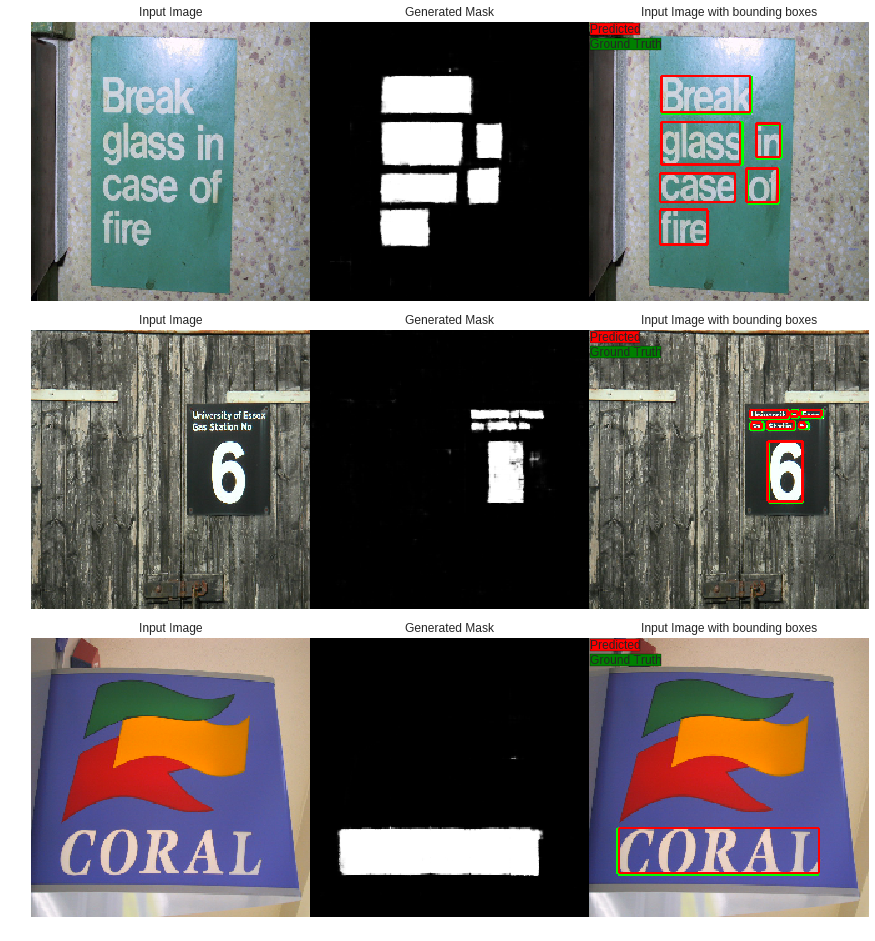

-------------------------Epoch Number: 61---------------------
Average Loss : 0.013395367981866002
-------------------------Epoch Number: 62---------------------
Average Loss : 0.013825276819989085
-------------------------Epoch Number: 63---------------------
Average Loss : 0.012474927911534905
-------------------------Epoch Number: 64---------------------
Average Loss : 0.011443545529618859
-------------------------Epoch Number: 65---------------------
Average Loss : 0.01075268886052072
-------------------------Epoch Number: 66---------------------
Average Loss : 0.011904362263157964
-------------------------Epoch Number: 67---------------------
Average Loss : 0.010812943102791905
-------------------------Epoch Number: 68---------------------
Average Loss : 0.020606226450763643
-------------------------Epoch Number: 69---------------------
Average Loss : 0.030371846770867704
-------------------------Epoch Number: 70---------------------
Average Loss : 0.01837678593583405


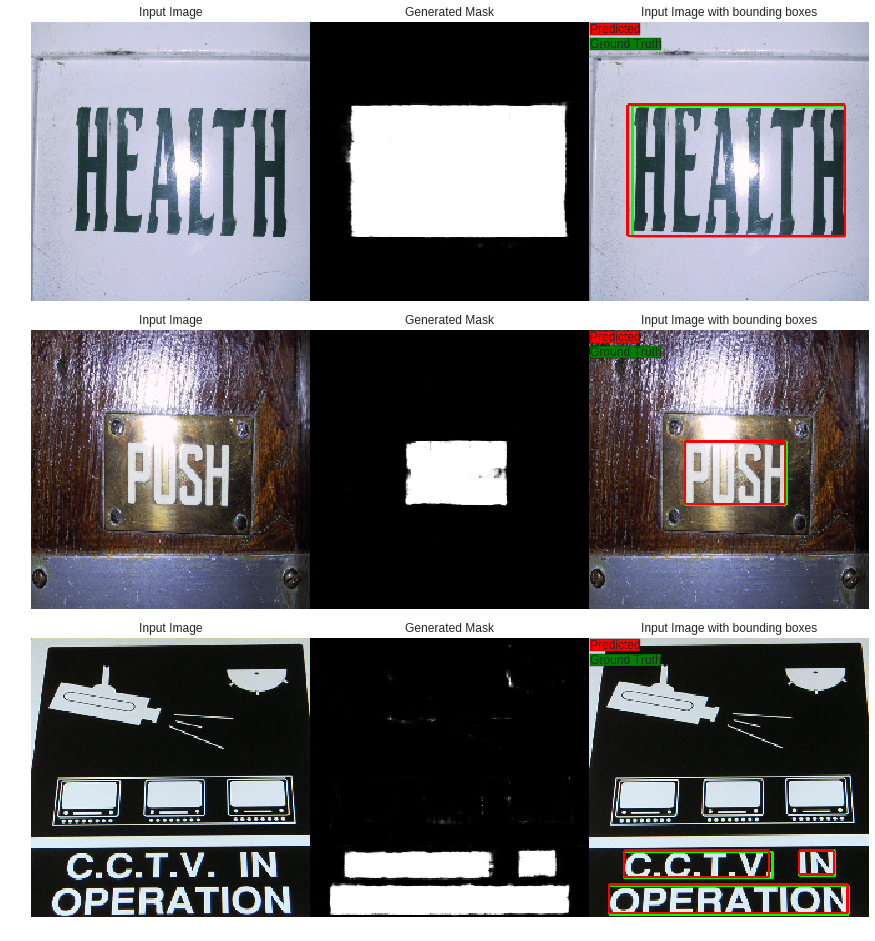

-------------------------Epoch Number: 71---------------------
Average Loss : 0.014779853262007236
-------------------------Epoch Number: 72---------------------
Average Loss : 0.013739751698449255
-------------------------Epoch Number: 73---------------------
Average Loss : 0.014896917901933194
-------------------------Epoch Number: 74---------------------
Average Loss : 0.01579249296337366
-------------------------Epoch Number: 75---------------------
Average Loss : 0.013443807698786258
-------------------------Epoch Number: 76---------------------
Average Loss : 0.0127858153777197
-------------------------Epoch Number: 77---------------------
Average Loss : 0.01403639786876738
-------------------------Epoch Number: 78---------------------
Average Loss : 0.013159234169870615
-------------------------Epoch Number: 79---------------------
Average Loss : 0.013345676520839334
-------------------------Epoch Number: 80---------------------
Average Loss : 0.011742893978953362


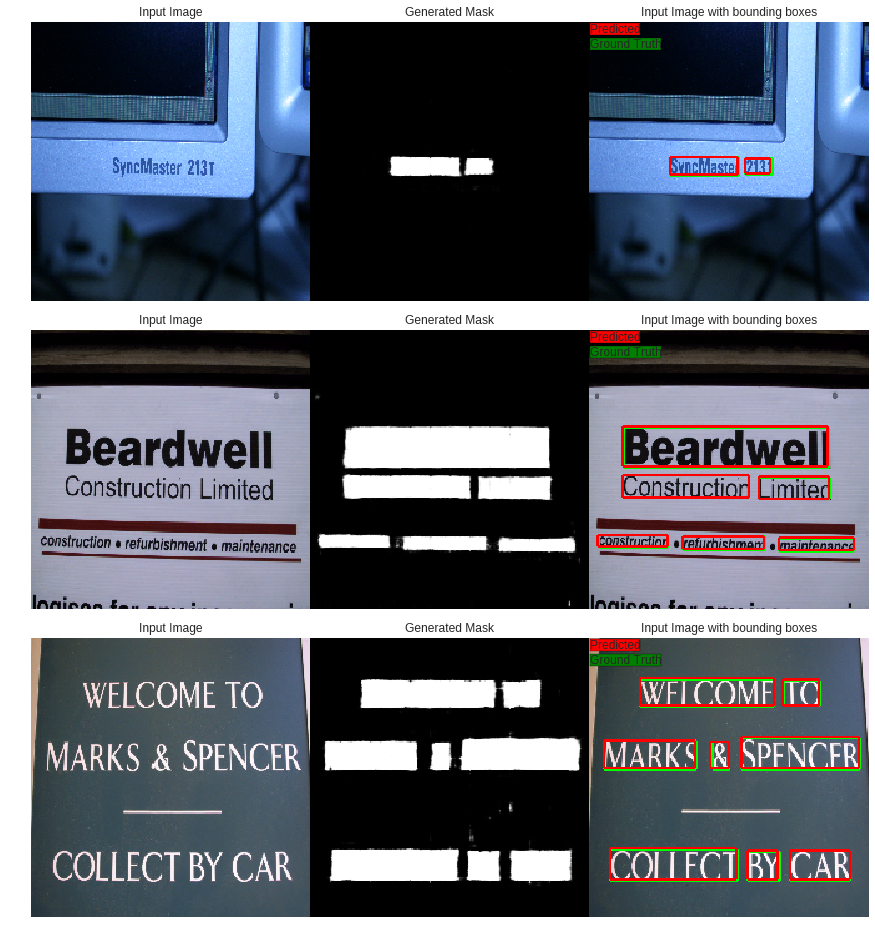

-------------------------Epoch Number: 81---------------------
Average Loss : 0.010449994378723204
-------------------------Epoch Number: 82---------------------
Average Loss : 0.010067657590843737
-------------------------Epoch Number: 83---------------------
Average Loss : 0.025994382961653174
-------------------------Epoch Number: 84---------------------
Average Loss : 0.024324396532028912
-------------------------Epoch Number: 85---------------------
Average Loss : 0.02041034968569875
-------------------------Epoch Number: 86---------------------
Average Loss : 0.013841864140704273
-------------------------Epoch Number: 87---------------------
Average Loss : 0.01126013146713376
-------------------------Epoch Number: 88---------------------
Average Loss : 0.019735922082327308
-------------------------Epoch Number: 89---------------------
Average Loss : 0.020727052865549923
-------------------------Epoch Number: 90---------------------
Average Loss : 0.015727979084476828


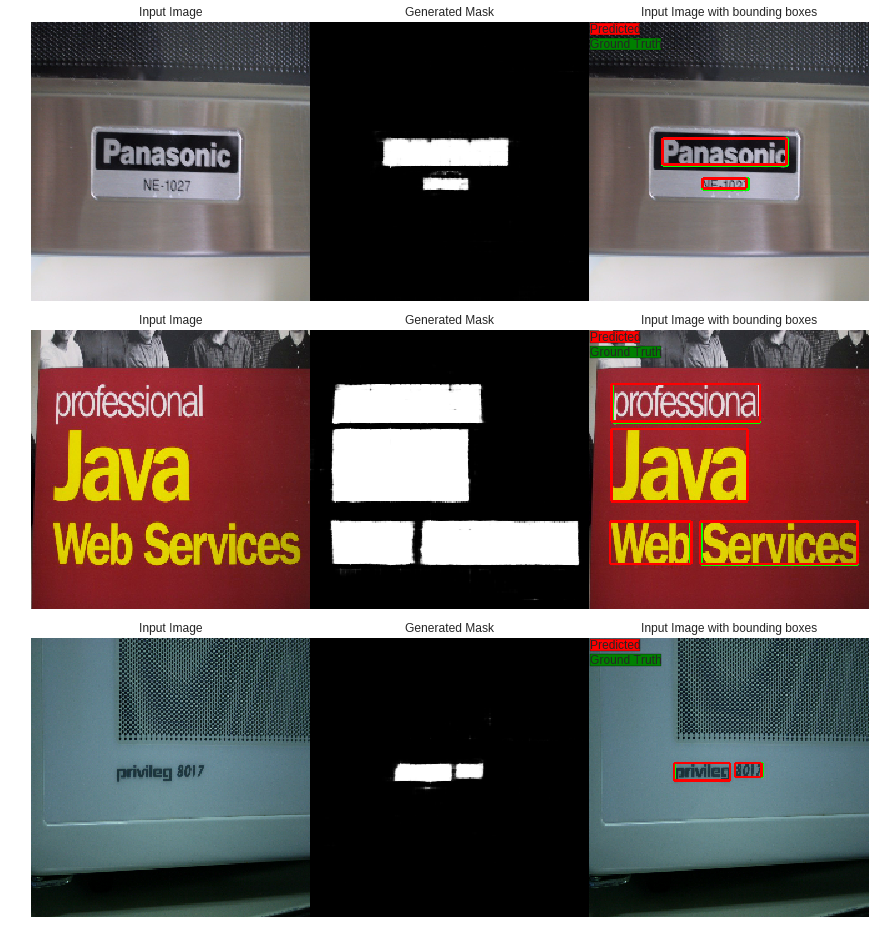

-------------------------Epoch Number: 91---------------------
Average Loss : 0.014647961547598242
-------------------------Epoch Number: 92---------------------
Average Loss : 0.011871344083920122
-------------------------Epoch Number: 93---------------------
Average Loss : 0.010275787953287364
-------------------------Epoch Number: 94---------------------
Average Loss : 0.009300843509845436
-------------------------Epoch Number: 95---------------------
Average Loss : 0.009958871779963374
-------------------------Epoch Number: 96---------------------
Average Loss : 0.009798648930154742
-------------------------Epoch Number: 97---------------------
Average Loss : 0.009348157537169754
-------------------------Epoch Number: 98---------------------
Average Loss : 0.009044298948720098
-------------------------Epoch Number: 99---------------------
Average Loss : 0.008571285381913185
-------------------------Epoch Number: 100---------------------
Average Loss : 0.007972640637308358


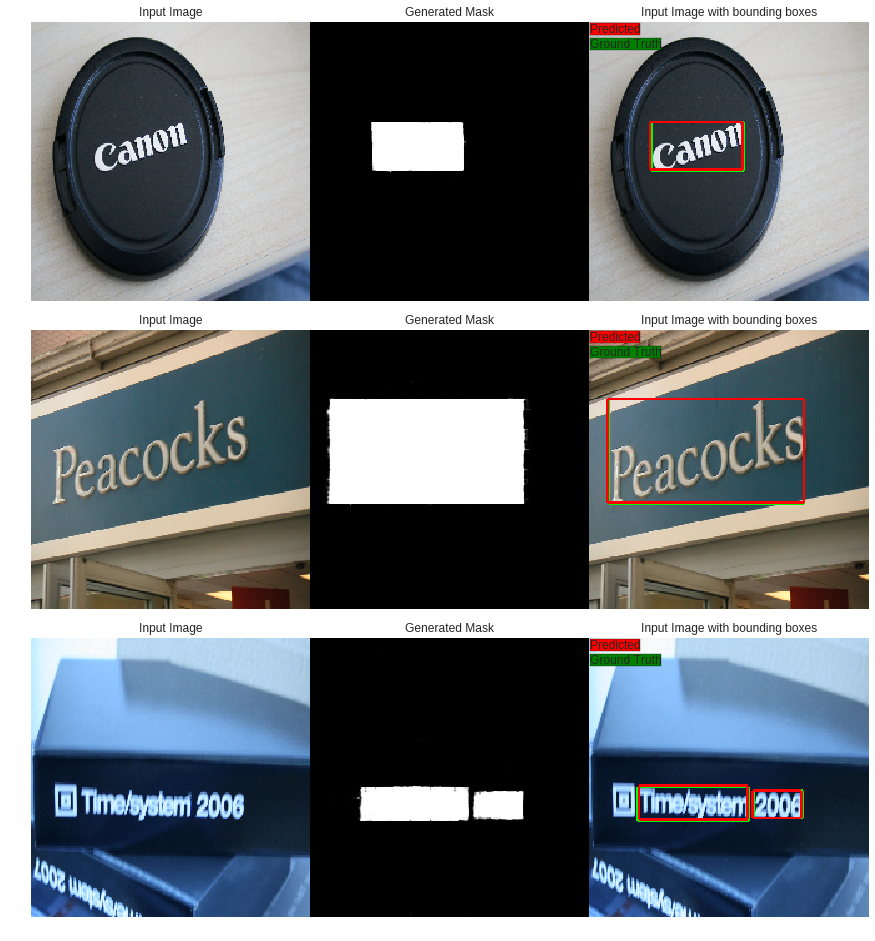

-------------------------Epoch Number: 101---------------------
Average Loss : 0.007108559925109148
-------------------------Epoch Number: 102---------------------
Average Loss : 0.006920636491850018
-------------------------Epoch Number: 103---------------------
Average Loss : 0.008739872998557986
-------------------------Epoch Number: 104---------------------
Average Loss : 0.00815027190838009
-------------------------Epoch Number: 105---------------------
Average Loss : 0.008187856269069016
-------------------------Epoch Number: 106---------------------
Average Loss : 0.014339337195269763
-------------------------Epoch Number: 107---------------------
Average Loss : 0.013474355707876385
-------------------------Epoch Number: 108---------------------
Average Loss : 0.01096811208408326
-------------------------Epoch Number: 109---------------------
Average Loss : 0.009517677710391581
-------------------------Epoch Number: 110---------------------
Average Loss : 0.0089847567724064


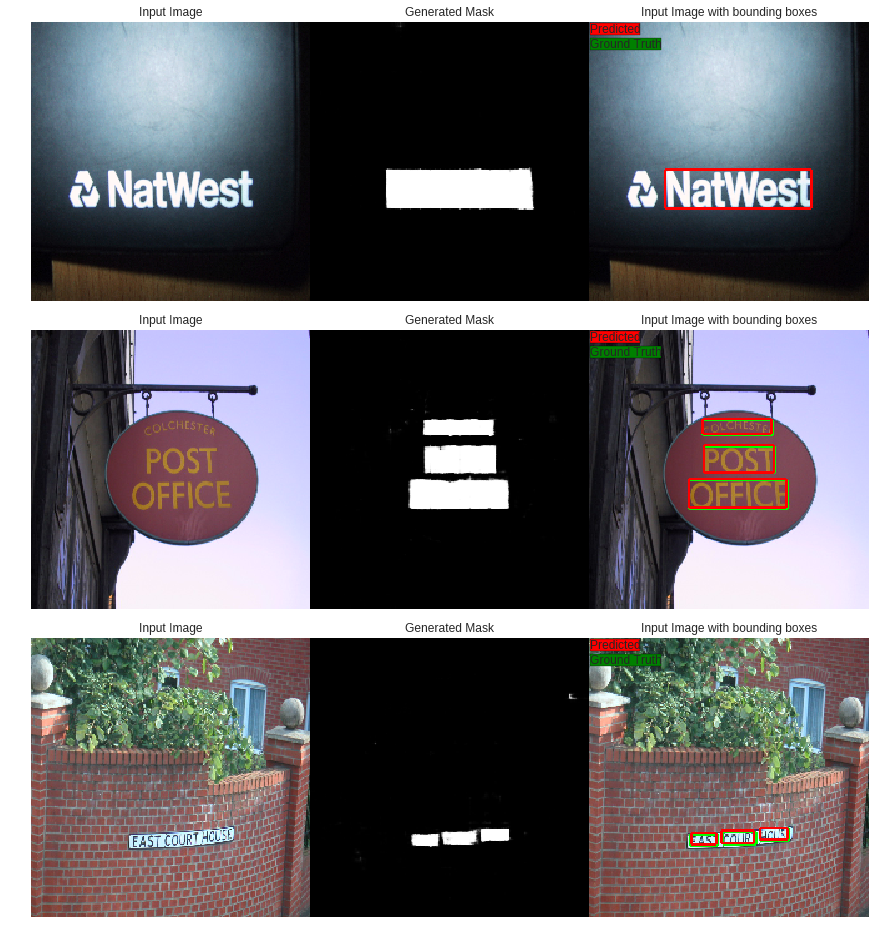

-------------------------Epoch Number: 111---------------------
Average Loss : 0.00838785336818546
-------------------------Epoch Number: 112---------------------
Average Loss : 0.01023525905329734
-------------------------Epoch Number: 113---------------------
Average Loss : 0.008098891843110323
-------------------------Epoch Number: 114---------------------
Average Loss : 0.007172322529368102
-------------------------Epoch Number: 115---------------------
Average Loss : 0.006801023567095399
-------------------------Epoch Number: 116---------------------
Average Loss : 0.007107485877349972
-------------------------Epoch Number: 117---------------------
Average Loss : 0.007070023077540099
-------------------------Epoch Number: 118---------------------
Average Loss : 0.008777523273602128
-------------------------Epoch Number: 119---------------------
Average Loss : 0.009104768419638276
-------------------------Epoch Number: 120---------------------
Average Loss : 0.007502110744826496


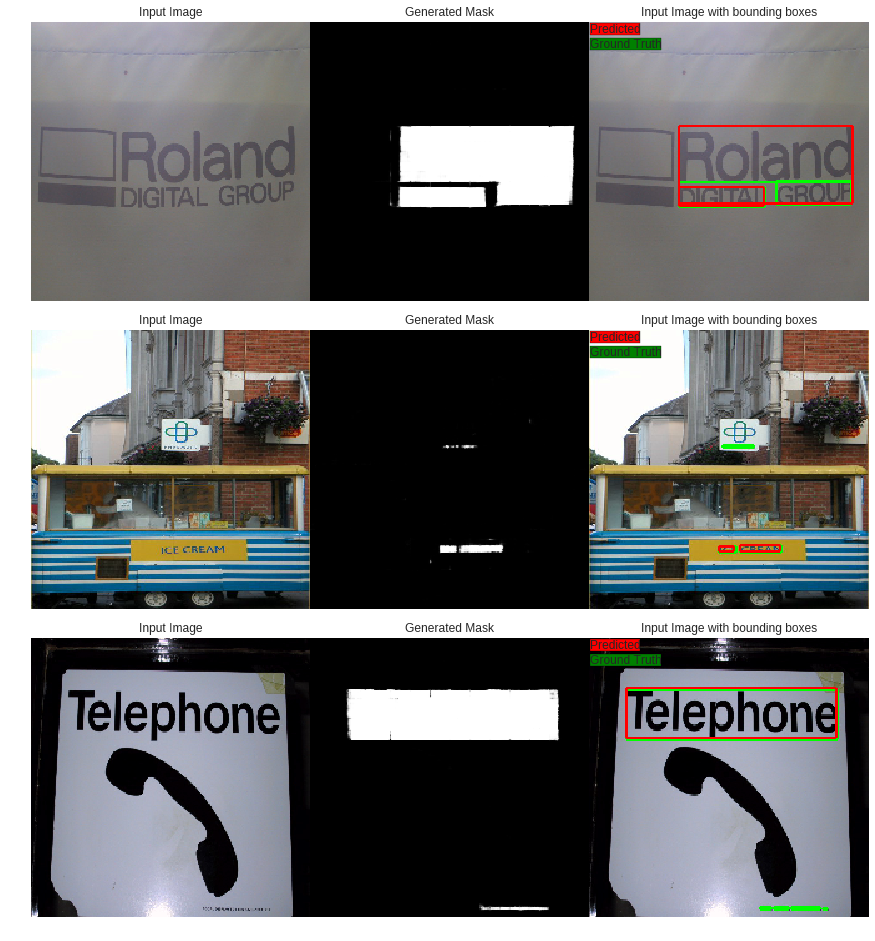

In [24]:
train_net(120)

###  Checking how it will perform in unseen images.

In [0]:
 class Un_seen_Dataset(Dataset):
    def __init__(self, image_path=r'Unseen'):
        self.image_path = image_path
        self.images_names = os.listdir(self.image_path)
        self.length = len(self.images_names)
        self.normalize = transforms.Compose([transforms.ToTensor(),transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
    
    def __len__(self):
        return self.length

    def __getitem__(self, index):
        input_image_name = self.images_names[index]
        input_image=Image.open(os.path.join(self.image_path,input_image_name))
        input_image_size=input_image.size
        input_image=input_image.resize((TD_Dataset.hight,TD_Dataset.width))
        input_image=self.normalize(input_image)
        return (input_image,input_image_size)

In [0]:
Un_seen_data=Un_seen_Dataset()
Un_seen_dataloader = DataLoader(Un_seen_data, batch_size=1, shuffle=True, num_workers=0)

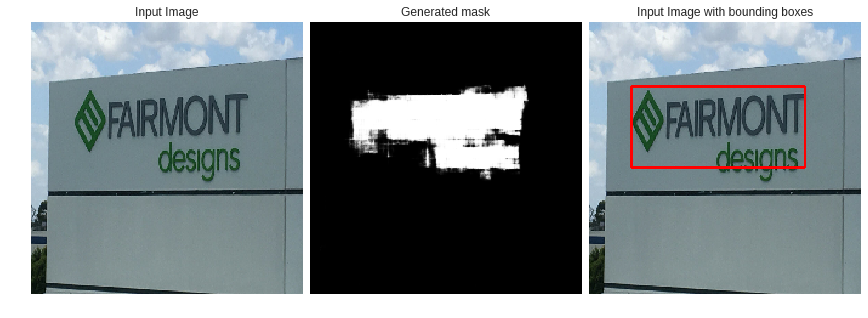

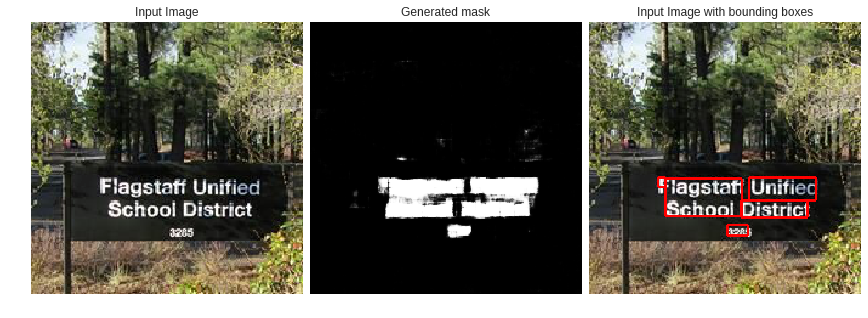

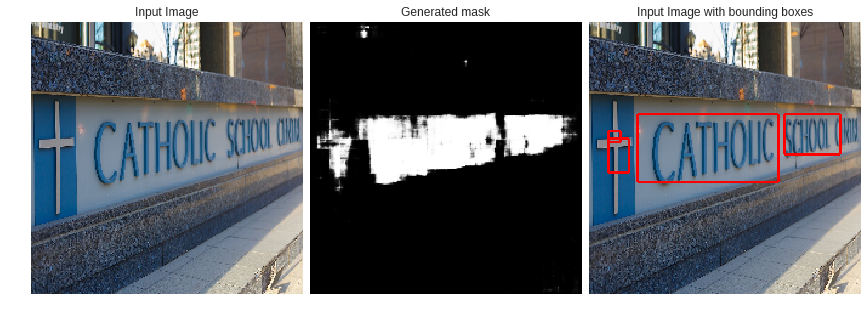

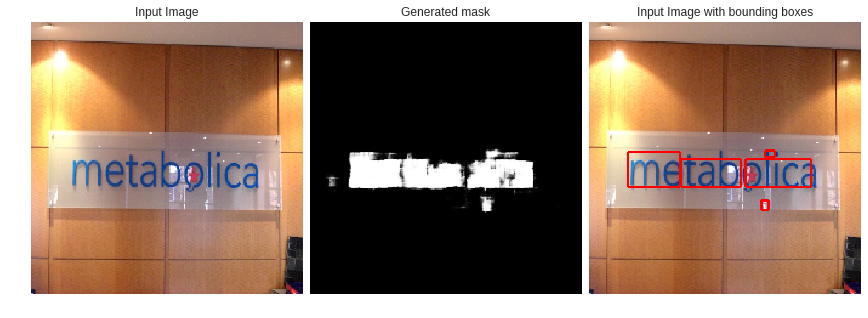

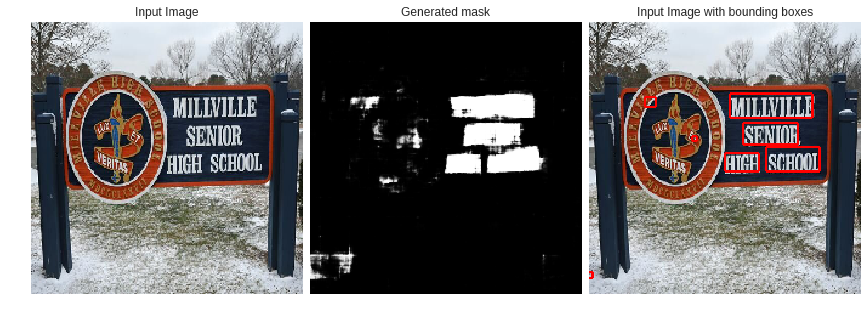

...

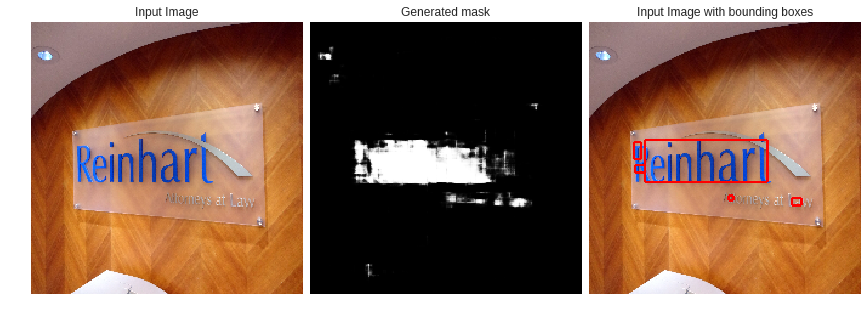

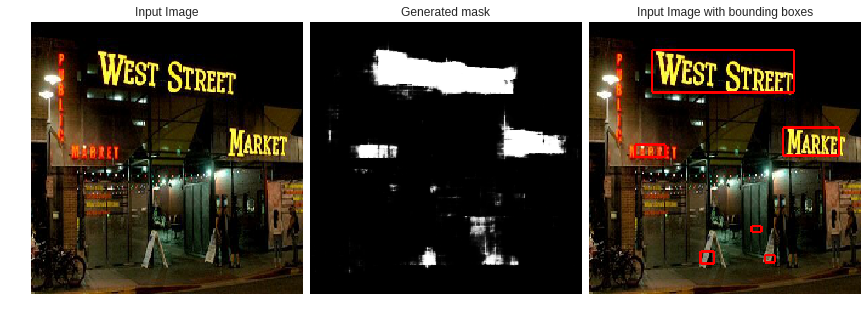

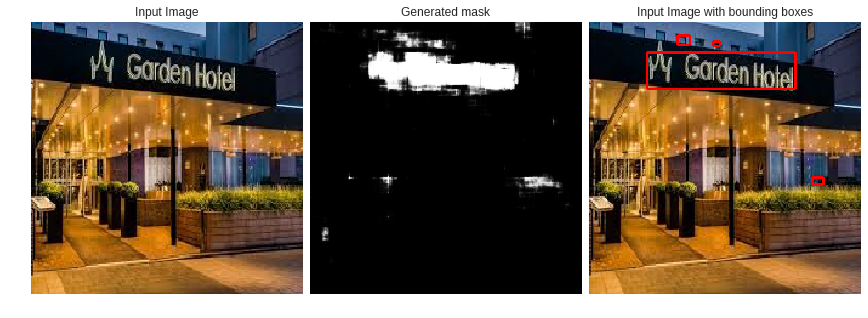

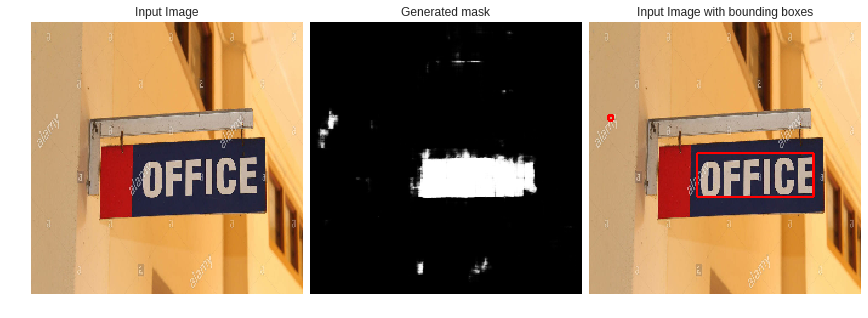

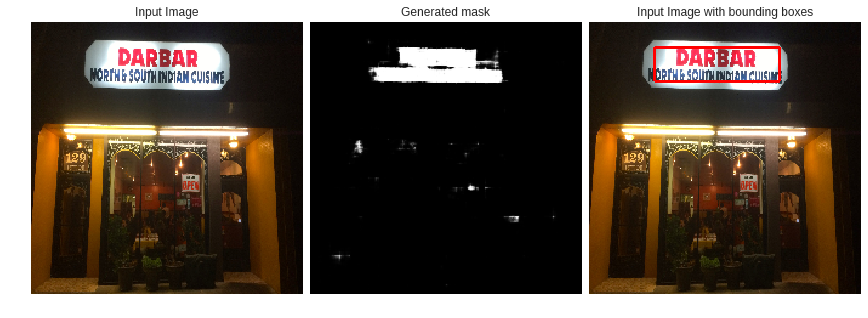

In [29]:
#Convert net to evaluation mode
net.eval()
with torch.no_grad():
    for i,data in enumerate(Un_seen_dataloader):
        #Make subplot
        figure,axis = plt.subplots(1, 3) 
        figure.set_figheight(5)
        figure.set_figwidth(15)
        image = data[0].view(1,3,TD_Dataset.hight,TD_Dataset.width)
        #Generate Mask
        output = net(image.to(device)).detach().to('cpu').view(TD_Dataset.hight,TD_Dataset.width)
        #Inverse of normalization for plotting
        org_image = inverse_preprocess(image).view(3,TD_Dataset.hight,TD_Dataset.width)
        #Plot images,mask and bounding boxes
        axis[0].imshow(org_image.permute(1,2,0))
        axis[0].title.set_text('Input Image')
        axis[1].imshow(output,cmap='gray')
        axis[1].title.set_text('Generated mask')
        #Plot predicted bounding box
        boxed_image=draw_boxes(give_boxes(output),org_image,1,'red')
        axis[2].imshow(boxed_image.permute(1,2,0))
        axis[2].title.set_text('Input Image with bounding boxes')
        axis[0].axis('off')
        axis[1].axis('off')
        axis[2].axis('off')
        plt.subplots_adjust(wspace=0, hspace=0)
        plt.show()